# Radar

## 1. Introduction
We will write the code in MATLAB to generate the Target scenario, FMCW waveform creation and later using processing techniques like FFT, CFAR we will create the Range Doppler Maps (RDM). For the second part of the project we will work on the MATLAB-based Driving Scenario Simulator to deploy multi object tracking and clustering and study the results.

### MATLAB

#### Install
https://www.mathworks.com/licensecenter/classroom/udacity_sf_radar/

#### Tutorial
https://www.mathworks.com/learn/tutorials/matlab-onramp.html

## 2. Radar Principles

### a) The Radar Sensor

#### Radar History
Radars have been in use since 1930s when they were primarily used by the military to detect aircraft, but since then the radar technology has come a long way and today they are increasingly being used as automotive radar sensor for advanced driver assistance systems (ADAS). The image below shows how radar sensors are used along with a full suite of other sensors in an autonomous vehicle:

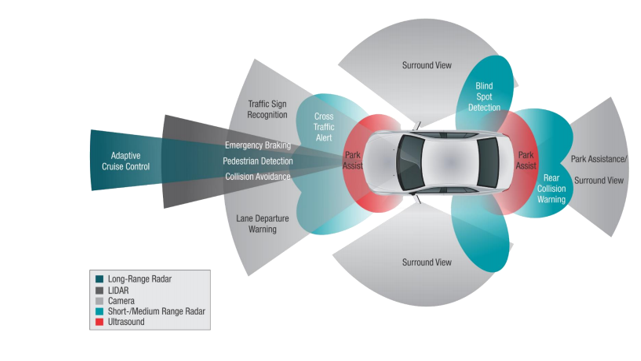

The advancements in the RF technologies and Digital Signal processing have made it possible to design efficient radars at low cost and in smaller sizes. The radar’s capability to determine the targets at long range with accurate velocity and spatial information make it an important sensor for self driving applications. Additionally, its capability to sense objects in dark and poor weather (rain, fog) conditions also help it cover the domains where LIDAR or camera may fail.

#### Radar Operation
Radar works using the transmission and detection of electromagnetic waves as seen in the following image:

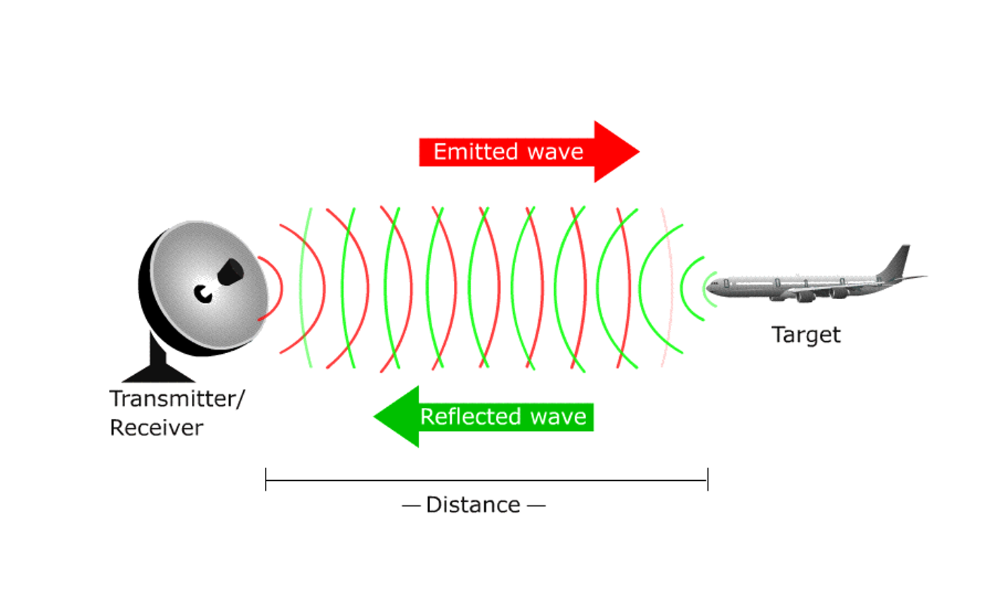
Radar Operation [source: electricalelibrary]

The electromagnetic waves are reflected if they meet an obstacle. If these reflected waves are received again at the place of their origin, then that means an obstacle is in the propagation direction.

The frequency of electromagnetic energy used for radar is unaffected by darkness and also penetrates fog and clouds. This permits radar systems to determine the position of road targets that are invisible to the naked eye because of distance, darkness, or weather.

Modern radar can extract widely more information from a target's echo signal than its range.

#### Radar Construction
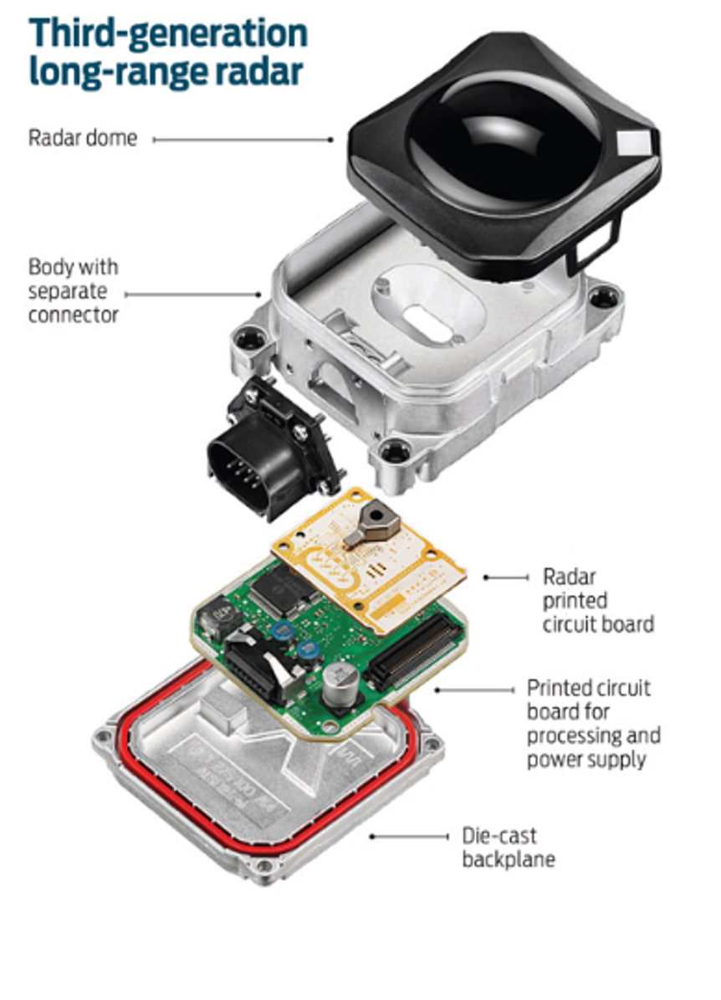
Bosch Automotive Radar

The automotive radars are small size sensors that can easily fit beneath the front grill or the bumper. As seen in the image above a radar module comprises of different parts.

* **Radar Dome or Radome**: A ***radome*** is a structural, weatherproof enclosure that protects a radar antenna. The radome is constructed of material that minimally attenuates the electromagnetic signal transmitted or received by the antenna, effectively transparent to radio waves.
* **Radar Printed Circuit Board**: This is analog hardware that includes the radar transceiver and antenna needed for radio wave generation.
* **Printed Circuit Board and Processing**: This includes the Digital Signal Processing (DSP) unit.

#### Radar vs Lidar
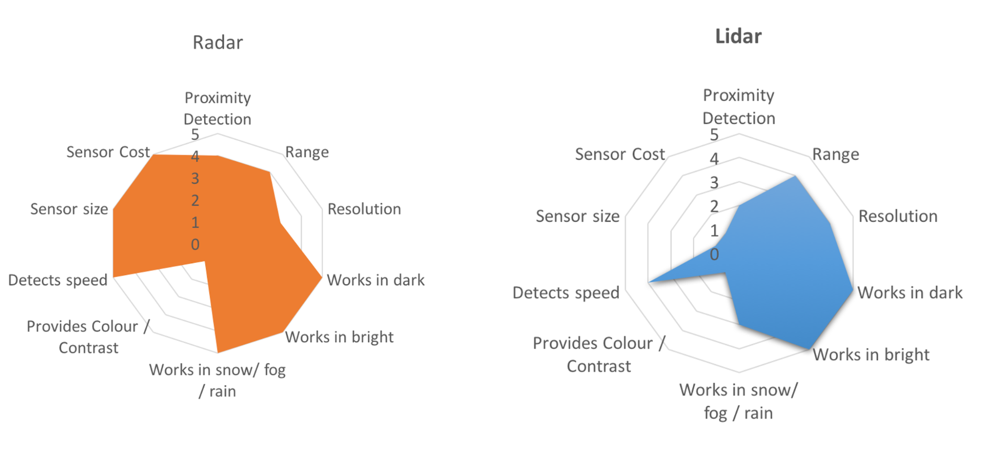
Comparison between RADAR and LIDAR [source: cleantechnica]

One can find many of articles comparing the LIDAR and RADAR, but in practice, these sensors are complementary to each other.

LIDAR can generate high resolution imaging based on reflection of the laser light off from the targets. But LIDARs fail in **bad weather conditions** as the very **small wavelength** doesn’t allow to work well in fog or rain. Additionally, LIDAR is an **expensive** sensor with costs varying from $35,000 to $100,000 as of 2019. Lidar is the preferred technology at Waymo.

Radar lacks the capability to generate a high resolution image, but it has highly accurate velocity estimation based on the doppler phenomenon, which we will cover in more detail later in this course. Also, radar wavelength allows it to sense the targets in bad weather conditions as well. Most important is the low manufacturing cost for a Radar. A radar unit can cost as low as a few hundred dollars, allowing a car manufacturer to deploy multiple Radar sensors for 360 degree perception. Tesla relies on Radar as its primary sensor and doesn’t include LIDAR in its sensor fusion system.

[Read how Delphi](https://www.mathworks.com/company/user_stories/delphi-develops-radar-sensor-alignment-algorithm-for-automotive-active-safety-system.html) used MATLAB and code generation to implement a radar safety system

### b) Signal Properties
In this concept, you will see a general overview of signal properties, including definitions of the wavelength of a signal and the general form for the equation of a signal.

#### Single Wave Parameters
Wavelength (λ) is the physical length from one point of a wave to the same point on the next wave, and it is calculated as: λ = speed of light / frequency

The higher the frequency the smaller the wavelength.

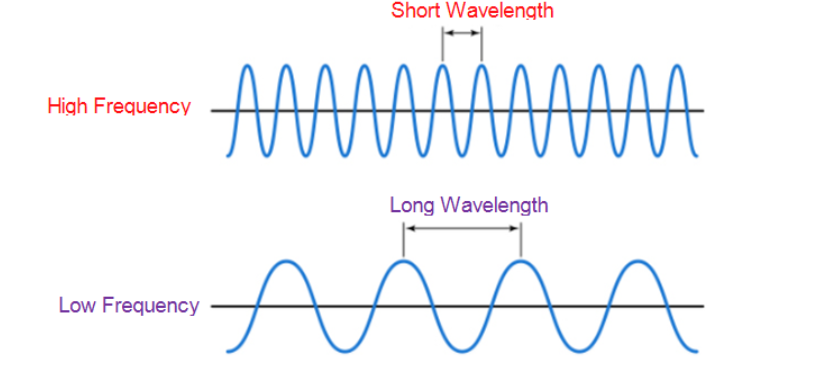
Wavelength of a signal
[source: techplayon http://www.techplayon.com/wavelength-frequency-amplitude-phase-defining-waves//]

The frequency of a wave is the number of waves that pass by each second, and is measured in Hertz (Hz). The automotive radar generally operates at W band (76GHz - 81GHz). The signal at this frequency is referred to as millimeterWave since the wavelength is in mm.

The Bandwidth of a signal is the difference between the highest and the lowest frequency components in a continous band of frequencies.

The Amplitude is the strength of the signal. Often it corresponds to the power of the RF signal/electromagnetic field defined in dB/dBm. It is relevant while configuring the output power of the radar and sensing the received signal. Higher the amplitude of the Radar signal, more is the visibility of radar. Automotive Radar can operate at max of 55 dBm output power (316 W)

dB, dBm, mW, and W conversions can be found [here](https://www.rapidtables.com/electric/dBm.html).

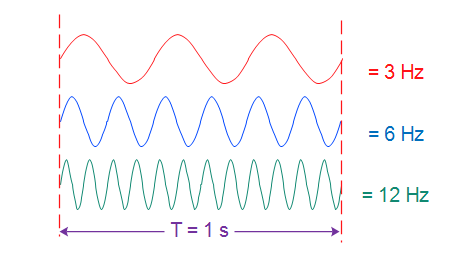
Frequency of a signal [http://www.techplayon.com/wavelength-frequency-amplitude-phase-defining-waves/]

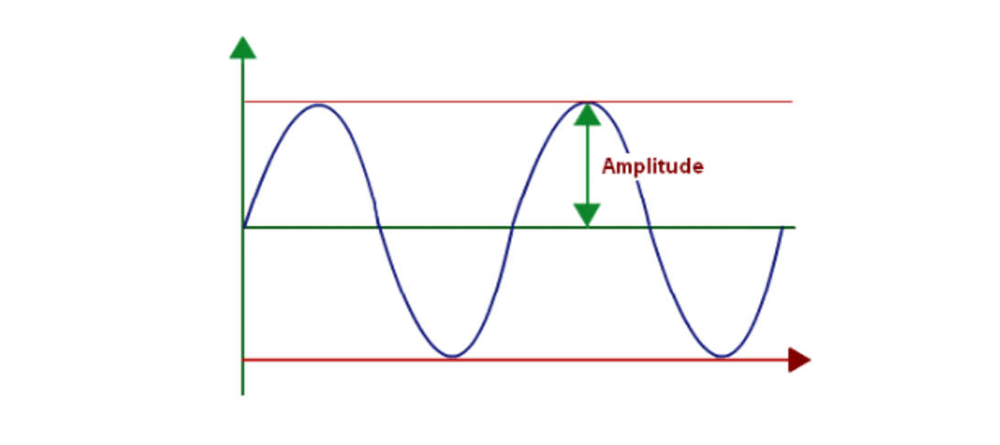
Amplitude of a signal [http://www.techplayon.com/wavelength-frequency-amplitude-phase-defining-waves/]

#### Phase of a Signal
Phase is a particular point in time on the cycle of a waveform, measured as an angle in degrees. A complete cycle is 360°. The phase for each argument value, relative to the start of the cycle, is shown in the image below, in degrees from 0° to 360° and in radians from 0 to 2π.

The frequency can also be defined as the first derivative of the phase with respect to the time. 

frequency = dt / dφ

where φ = phase of the signal

This property will be used in measuring the doppler frequency shift for a moving target.

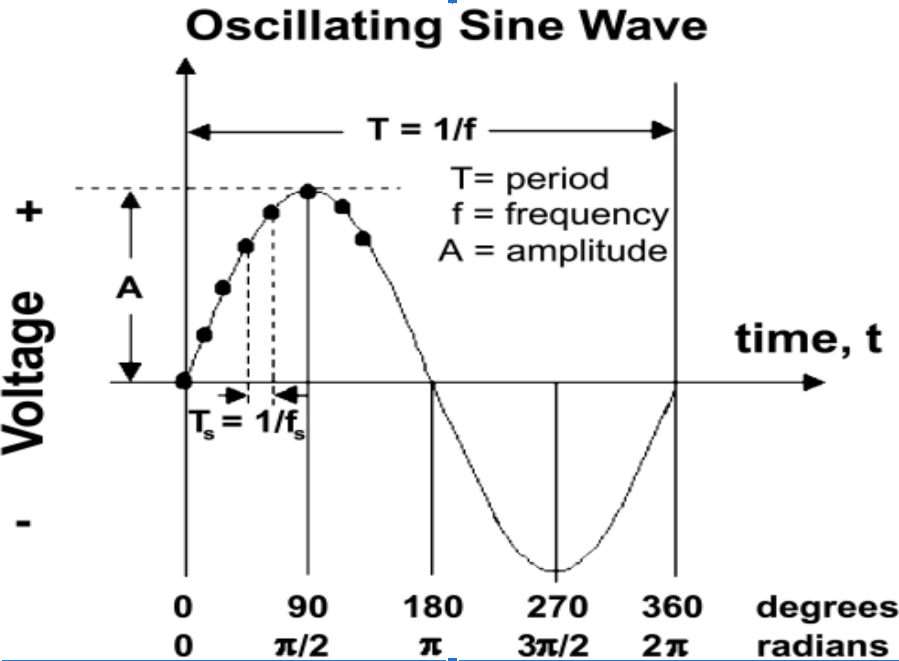

The difference between the phases of two periodic signals is called the phase difference. At values of when the difference is zero, the two signals are said to be in phase, otherwise they are out of phase with each other.

The phase information processing is important as we go through doppler processing as well as Angle of Arrival techniques for radar.

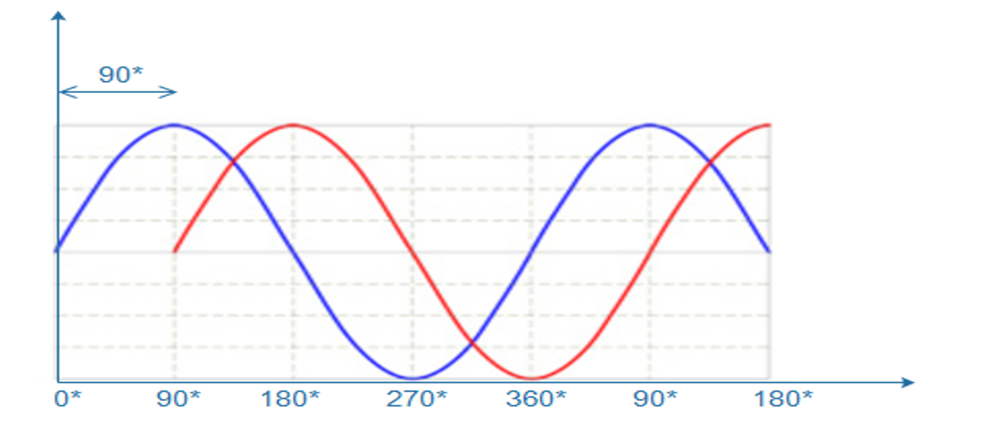

#### General Equation of a Wave
A wave travelling in space is defined by the following equation:

y(t)=Acos(2π⋅fc⋅t+ϕ)

Below, the variables in the equation are defined:

* A is the amplitude of the signal
* fc is the signal frequency
* ϕ is the phase of the signal

#### Wavelength Exercise
Calculate the wavelength (λ) in mm for the signal traveling at 77 GHz frequency.

**Answer: 3.896 mm**


### c) FMCW
FMCW radar (***Frequency-Modulated Continuous Wave radar***) is a special type of radar sensor which **radiates continuous transmission power**. FMCW radar’s ability to measure **very small ranges to the target** as well as its ability to measure **simultaneously the target range and its relative velocity** makes it the first choice type of radar for automotive applications.

#### FMCW Chirps

##### What is a Chrip?
* A chirp is a radar signal whose frequency is increasing or decreasing over time
* Up-chrip / Down-chrip
* Some fo the radars use repeated chirp signals to compute both distance and velocity

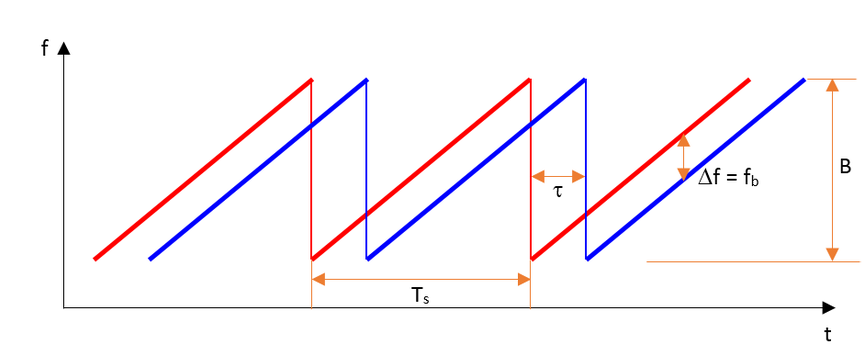

A ***Frequency Modulated Continous Wave (FMCW)*** is a signal in which the frequency increases/decreases with time. They are also referred to as **upramps** and **downramps**. The two most common waveform pattern used for FMCW radars are **sawtooth** and **triangular**. The sawtooth waveform generally uses **just the upramps**, whereas the triangular waveform uses **both upramps and downramps**.

Each chirp is defined by its slope. The slope is given by its chirp frequency bandwidth B or B_sweep (y-axis) and its chirp time T_s (x-axis). Hence,

Slope = B / T_s

The **range resolution** requirement decides the **B**, whereas the **maximum velocity** capability of a radar is determined by the chirp time **T_s**. We will discuss this in more detail in later sections.

One **chirp sequence** or **segment** comprises of **multiple chirps**. Each chirp is sampled multiple times to give multiple range measurements and radar transmits in order to measure doppler velocity accurately.

In the course project you will sample each chirp 1024 times and send 128 of these chirps to estimate the range and doppler velocity. So, the segment in this case would comprise of 128 chirps.

##### Chirp Slope
Determine the slope of the sweeps with frequency from 77GHz to 77.113 GHz in time duration of 18 microseconds.

**Answer: 6.27778 MHz/μs**

#### Additional Resources
Additional information can be found on radartutorial.eu [here](http://www.radartutorial.eu/02.basics/Frequency%20Modulated%20Continuous%20Wave%20Radar.en.html).


### d) FMCW Hardware

#### FMCW Hardware Overview

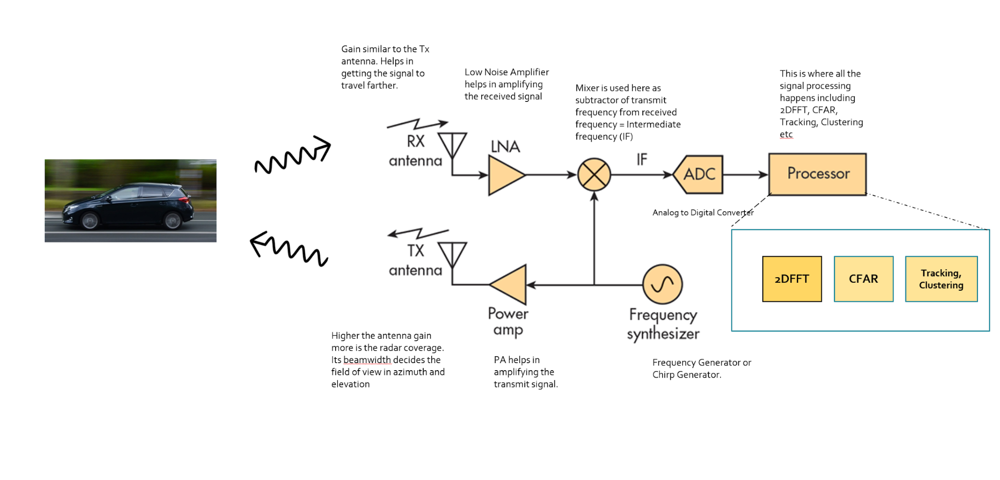
Hardware implementation of the FMCW Radar

**Frequency Synthesizer**: The frequency synthesizer is the component that generates the frequency to bring the chirp frequency all the way to 77GHz in case of automotive radar.

**Power Amp**: The power amp amplifies the signal so the signal can reach long distance. Since the signal attenuates as it radiates, it needs higher power (amplitude) to reach targets at greater distances.

**Antenna**: The antenna converts the electrical energy into electromagnetic waves which radiate through the air, hit the target, and get reflected back toward the radar receiver antenna. The Antenna also increases the strength of the signal by focusing the energy in the desired direction. Additionally, the antenna pattern determines the field of view for the radar.

**Mixer**: In FMCW radar, the mixer multiplies the return signal with the sweeping signal generated by the frequency synthesizer. The operation works as frequency subtraction to give the frequency delta - also known as frequency shift or Intermediate frequency (IF). IF = Synthesizer Frequency - Return Signal Frequency.

**Processor**: The processor is the processing unit where all the Digital Signal processing, Detection, Tracking, Clustering, and other algorithms take place. This unit could be a microcontroller or even an FPGA.

#### Antenna Details
As defined in the FMCW Hardware definitions, the antenna is a transducer that converts the electrical energy into electromagnetic waves. In the case of radar, these waves travel through the air and hit the target. Depending on the surface type and shape of the target, the waves get partially reflected back in the direction of the radar. The receiver antenna at the radar amplifies the received signal further and sends it to the receiver chain for further processing.

#### The Antenna Pattern

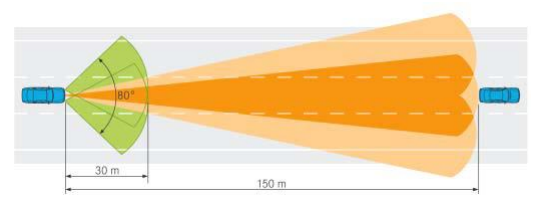

The antenna pattern is the geometric pattern of the strengths of the relative field emitted by the antenna.

The beamwidth of the antenna determines the field of view for the radar sensor. If the requirement for the radar is to just sense the targets in its own lane then the beamwidth needs to be small enough to cover the complete lane up to desired range. If the beamwidth is wider than the lane width, it will sense the targets in the other lanes as well.

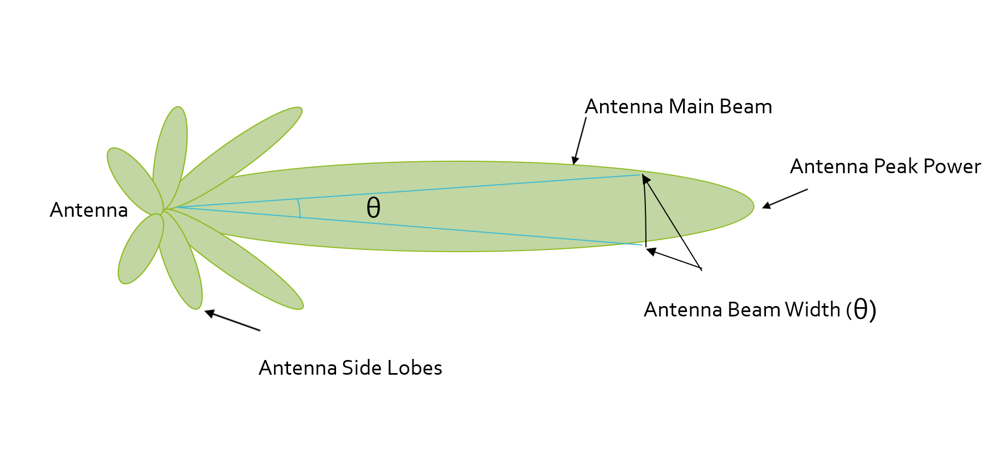

Antenna radiation not only comprises of the **main beam** but the **sidelobes** as well. Antenna sidelobes are critical because they can generate **false alarms** and pick **interference** from **undesired direction**. As seen in the pattern, the sidelobes of the antenna point in different directions and can sense targets that are not in the main beam. To avoid sidelobe detections it is critical to **suppress** the sidelobe levels to **more than 30dB** from the peak of the main beam.

#### Antenna Types

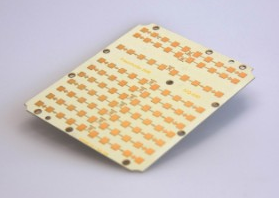
Patch Array Antenna [https://www.fhr.fraunhofer.de/en/businessunits/traffic/antenna-development-for-the-automotive-sector.html]

There are many types of antenna (**dipole, patch, horn**) that can be used at 77GHz, but the most commonly used antenna type in automotive radar is the **patch antenna**. The **low cost, easy fabrication, and low profile** of Patch Array Antennas makes them an ideal choice for automotive radar applications.

The antenna in general is composed of several patches. The difference in signal received between different patches is used to compute the reflected angle


### e) Radar Cross Section

#### Radar Cross Section Overview
The size and ability of a target to reflect radar energy is defined by a single term, σ, known as the radar cross-section, which has units of m^2. This unit shows that the radar cross section is an area. The target radar cross sectional area depends on:

* The target’s physical geometry and exterior features:
    * Smooth edges or surface would scatter the waves in all directions, hence lower RCS. Whereas, sharp corners will focus the return signal back in the direction of the source leading to higher RCS. (Image below for different target geometries)
* The direction of the illuminating radar,
* The radar transmitter’s frequency,
* The material used in the cars, trucks, bicycles, and even in some cases, the clothing material for pedestrians.

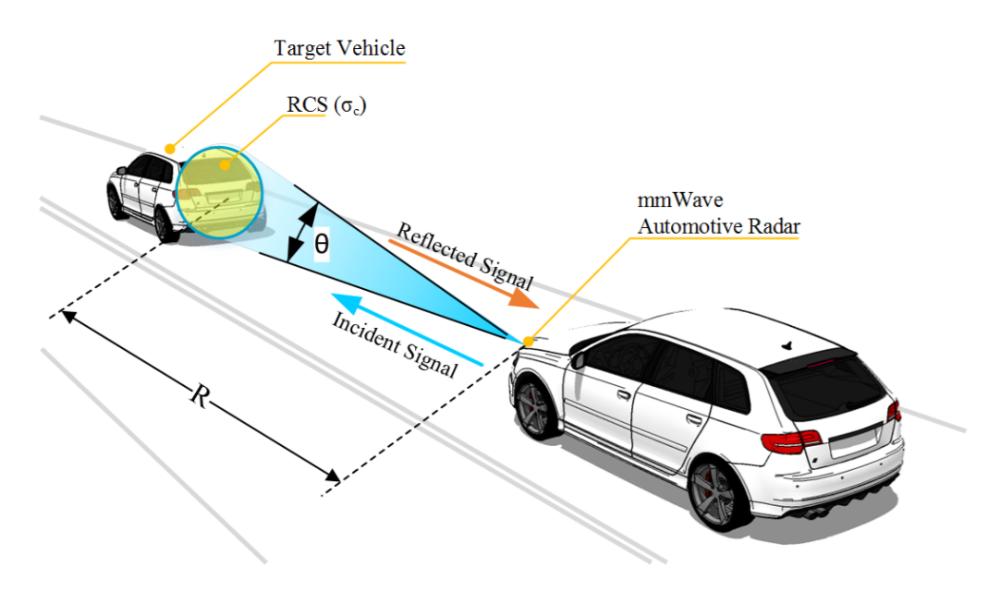
RCS of the target vehicle, source : https://arxiv.org/pdf/1607.02434.pdf

If absolutely all of the incident radar energy on the target were reflected equally in all directions, then the radar cross section would be equal to the target's cross-sectional area as seen by the transmitter. In practice, some energy is absorbed and the reflected energy is not distributed equally in all directions. Therefore, the radar cross-section is quite difficult to estimate and is normally determined by measurement.

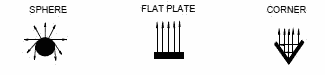
Returns from Different Target Geometries, source : http://www.radartutorial.eu

#### RCS Units
This RCS can also be defined using a logarithmic value (dB), since it increases the return signal strength. The formula for converting from RCS to dB is given by:

RCS_dB = 10log(RCS_m^2)

The following table shows RCS values for different targets in both m^2 and dB. You can use the formula above to see how the two columns of the table are related. For example, from the table below we can see that for an automobile:

RCS_dB = 10log(100) = 20

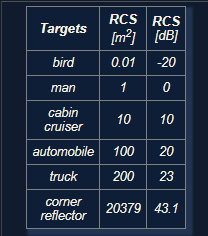
RCS of different targets, source : http://www.radartutorial.eu

#### RCS Quiz

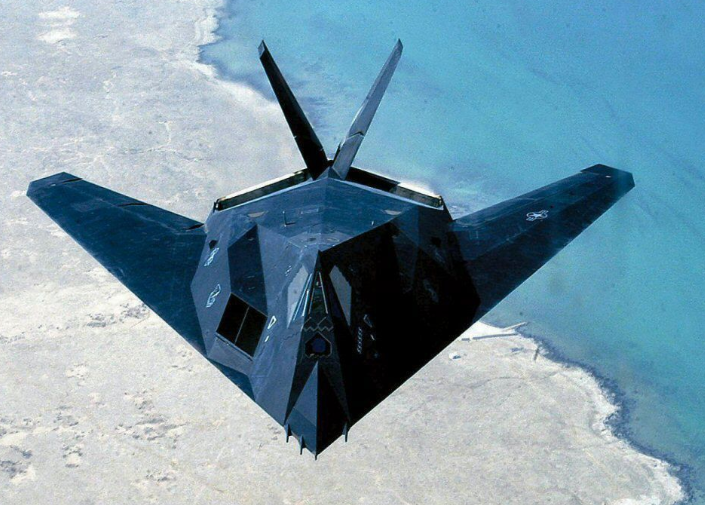

What makes stealth aircraft go undetected by radars?
* The aircraft's Smooth Surface
* The non-reflective paint
* The geometry of the Aircraft


### f) Radar Range Equation

#### Range Equation Overview
Using the Radar Range equation we can design the radar transmitter, receiver, and antenna to have the desired power, gain and noise performance to meet the range requirements.

A long range radar designed to cover 300m range and detect a target with smaller cross section would need higher transmit power and more antenna gain as compared to a short range radar designed to cover just 50m for similar target. A target with higher cross section can be detected at a longer range as compared to a target with smaller cross section.

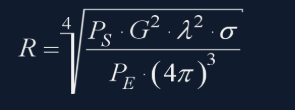
Radar Equation, source : http://www.radartutorial.eu

* R - Maximum Range a radar can detect targets.
* P_s - Transmitted Power from Radar (dBm)
* G - Gain of the Transmit/Receive Antenna (dBi)
* λ - Wavelength of the signal (mm)
* σ - radar cross section (m^2)
* P_E - Minimum received power radar can detect.

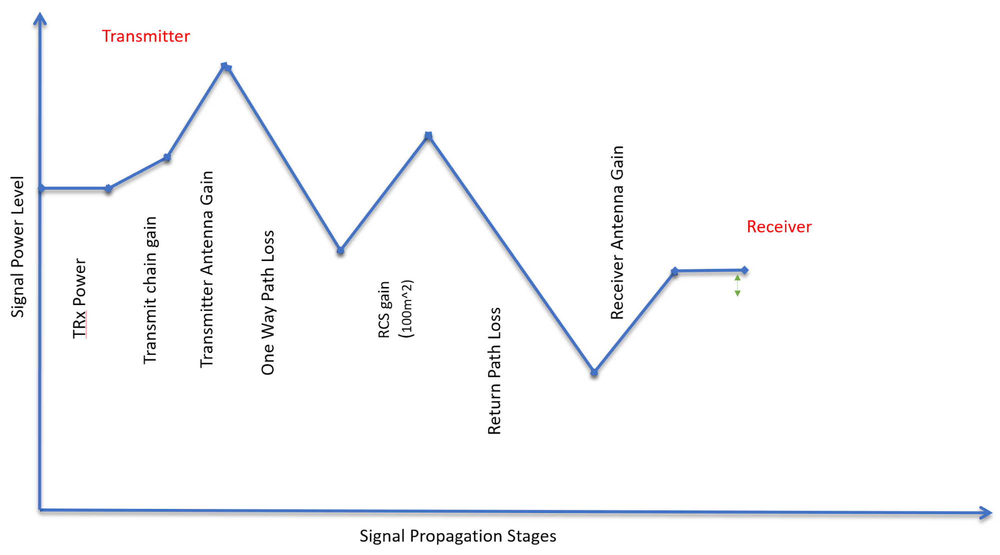
The image above shows the variation in the signal strength level as it travels through transmitter, over the air and at the receiver

The image above shows the variation in the signal strength level:

* The transmitter power
* Power Amplifiers further increase the signal strength - Transmit chain gain
* Signal is further amplified using an antenna
* One Way Path Loss represents the loss in the signal strength as it travels towards the target
* On getting reflected from the target the signal gets amplified based on the RCS of the target
* After RCS gain the signal travel back towards the radar and has similar loss in strength as going forward
* The receiver antenna amplifies the return signal before sending it to the processing unit

#### Radar Detection
Below is an illustration showing the output of a radar's range detection. The peaks correspond to the strength of the return signal from targets and the frequency relates to the range. Relationship between frequency and range will be discussed in next lesson.

A radar cannot detect a signal that is below the noise level. The noise level is determined by the **thermal noise generated by the receiver**. To successfully detect a target, the return signal strength needs to be larger than the noise level. This is defined by a property called signal to noise ratio, or _SNR.

**SNR** is a quantitative measure of a signal strength as compared to the level of noise. If the SNR is too low it becomes difficult for a radar to distinguish the signal from noise. Hence, higher SNR is desirable for successful detection of the target. Generally, a **7-13 dB SNR** ensures successful detection in a road scenario.

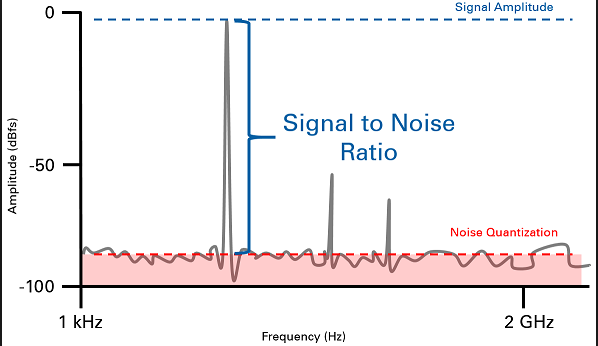
Signal to Noise Ratio

The image above shows the logarithmic value of SNR = power level (in dBm) - noise level (dBm). The plot shows the output of Range FFT (discussed in Lesson 2). In general, the higher the SNR value, the greater are the chances of successful Radar detection.

#### Matlab Exercise: Maximum Range Calculation
The following MATLAB code provides some parameters which can be used in the range equation given above. Your task is to complete the TODOs in the following code:

1. Use the speed of light cc to compute the wavelength \lambdaλ.
2. Use the results from part 1. along with the range equation to compute the radar range.
3. Print the range to screen using disp(range).

> see in `radar_max_range.m`


### g) What Dose a Sensor Fusion Engineer Need to Know?
* Background Info about sensors
* Deeply understand the sensors


## 3. Range-Doppler Estimation

### a) Range, Velocity, and Angle Resolution
In this lesson, you will learn about the basics of range and velocity estimation using doppler and Fourier transform techniques. Before you get started, let's have a look at three primary dimensions of measurement for radar resolution.

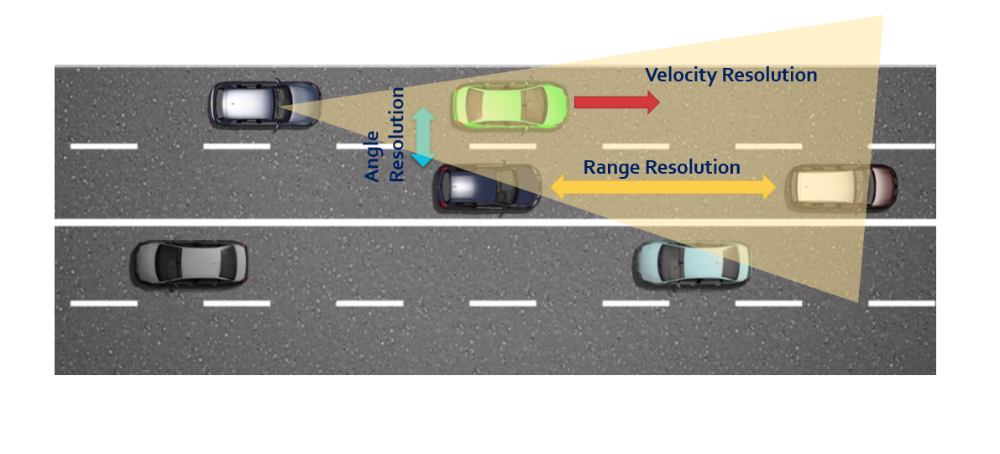
Capability of a radar to resolve two targets based on differences in their distance, angle and velocity.

The capability of a radar to resolve targets is very critical for an accurate perception.

**Range Resolution**: It is the capability of the radar to distinguish between two targets that are very close to each other in range. If a radar has range resolution of 4 meters then it cannot separate on range basis a pedestrian standing 1 m away from the car.

The range resolution is solely dependent on the **bandwidth of the chirp B_sweep**:

**d_res = c / 2B_sweep**

**Velocity Resolution**: If two targets have the same range they can still be resolved if they are traveling at different velocities. The velocity resolution is dependent on the number of chirps. As discussed for our case we selected to send 128 chirps. A **higher number of chirps increases the velocity resolution, but it also takes longer to process the signal**.

**Angle Resolution**: Radar is capable of separating two targets spatially. If two targets are at similar range travelling at same velocities, then they can still be resolved based on their angle in radar coordinate system. Angle resolution depends on different parameters depending on the **angle estimation technique used**. We will cover this in more detail in the next lesson.

#### QUIZ QUESTION
For a dense urban traffic scenario, what would be a helpful feature of FMCW radar?

**Answer: Higher Bandwidth of a chrip**


### b) Range Estimation

#### Range Estimation Overview

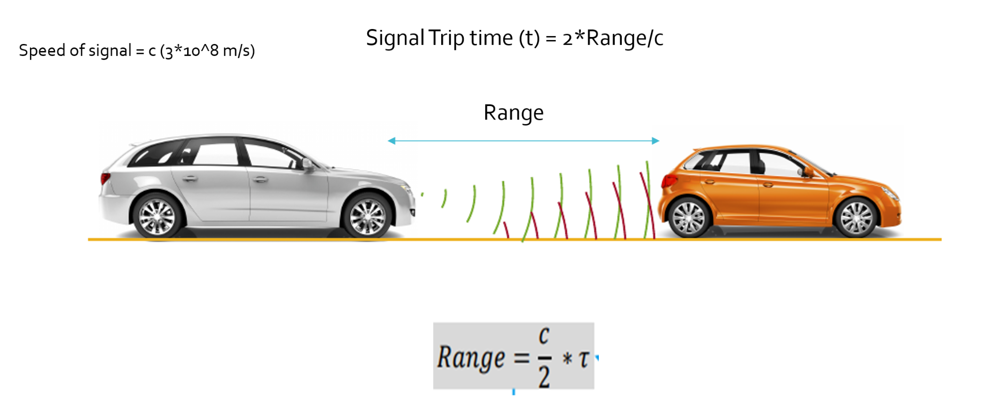
Signal trip time for a radar signal.

Radar determines the range of the target by measuring the trip time of the electromagnetic signal it radiates. It is known that EM wave travels at a known speed (300,000,000 m/s), so to determine the range the radar needs to calculate the trip time. How?

Answer: By measuring the shift in the frequency.

#### Range Estimation Equation

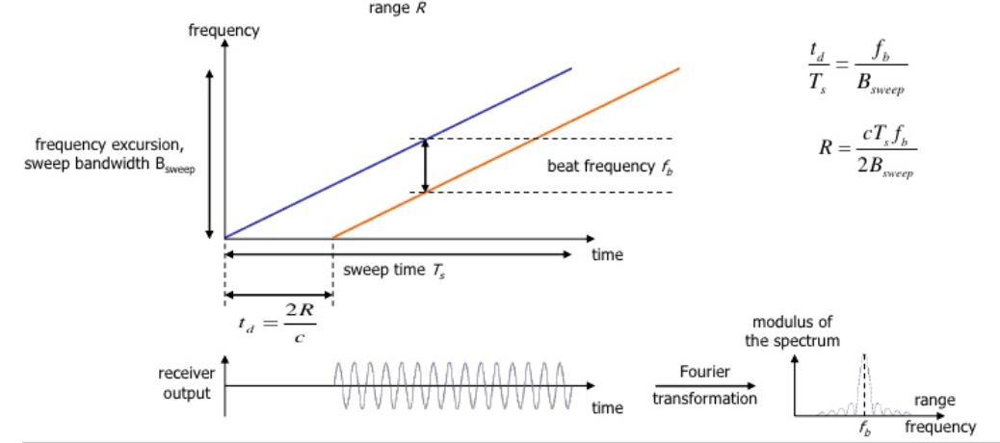
Range Estimation using FMCW, source : Delft University of Technology

The FMCW waveform has the characteristic that the frequency varies linearly with time. If radar can determine the delta between the received frequency and hardware’s continuously ramping frequency then it can calculate the trip time and hence the range. We further divide Range estimate by 2, since the frequency delta corresponds to two way trip.

It is important to understand that if a target is stationary then a transmitted frequency and received frequency are the same. But, the ramping frequency within the hardware is continuously changing with time. So, when we take the delta (beat frequency) between the received and ramping frequency we get the trip time.

**R = c*T_s*f_b / 2B_sweep**

Here, f_b is the beat frequency, which is measured by the radar by subtracting the received frequency from the hardware’s ramping frequency:

f_b = f_ramping − f_received

As seen in the equation, the range calculation requires chirp time T_s and chirp Bandwidth B_sweep. Those values are determined as we define the configuration of the radar based on its range resolution and trip time for Radar’s maximum range.

#### System Level Range Calculation

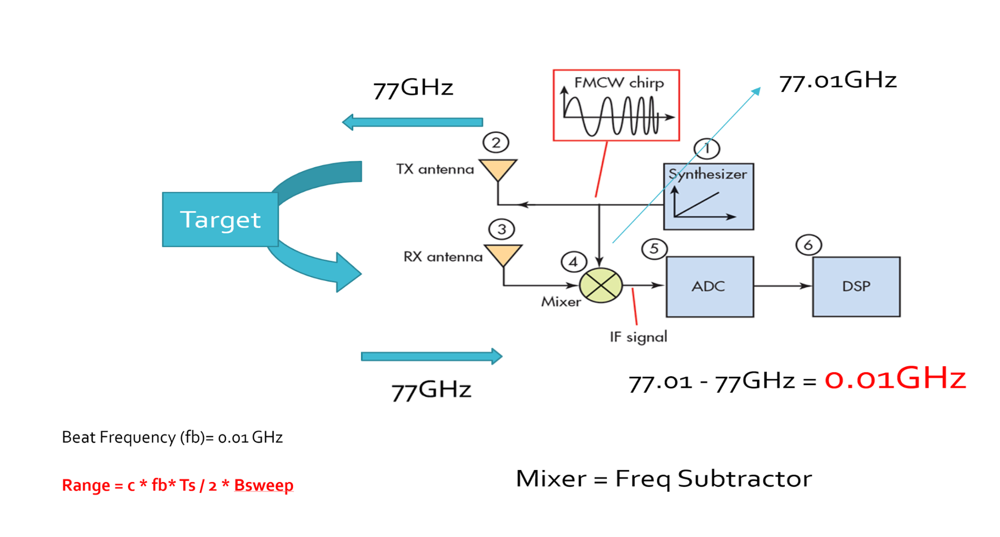
Range Calculation - System Level, source : electronicdesign.com

As seen in the image above, the Synthesizer generates FMCW chirp for a given B_sweep and T_s. Let’s say the signal gets transmitted at 77GHz and it returns to the radar after hitting the target in a certain time duration. The radar receiver captures the signal, processes (subtraction) and measures the frequency delta between received signal and linearly ramping signal. This delta in frequency is called as beat frequency and it is proportional to the trip time. So based on the equation above, the radar calculates the range.

#### Range Estimation Exercise
Using the following MATLAB code sample, complete the TODOs to calculate the range in meters of four targets with respective measured beat frequencies [0 MHz, 1.1 MHz, 13 MHz, 24 MHz].

You can use the following parameter values:
* The radar maximum range = 300m
* The range resolution = 1m
* The speed of light c = 3*10^8

Note : The sweep time can be computed based on the time needed for the signal to travel the maximum range. In general, for an FMCW radar system, the sweep time should be at least 5 to 6 times the round trip time. This example uses a factor of 5.5:

T_chirp =5.5 * 2 * R_max / c

Print your answer using the `disp` function.

> see code in `range_estimation.m`


### c) Doppler Estimation

#### Doppler Estimation Overview

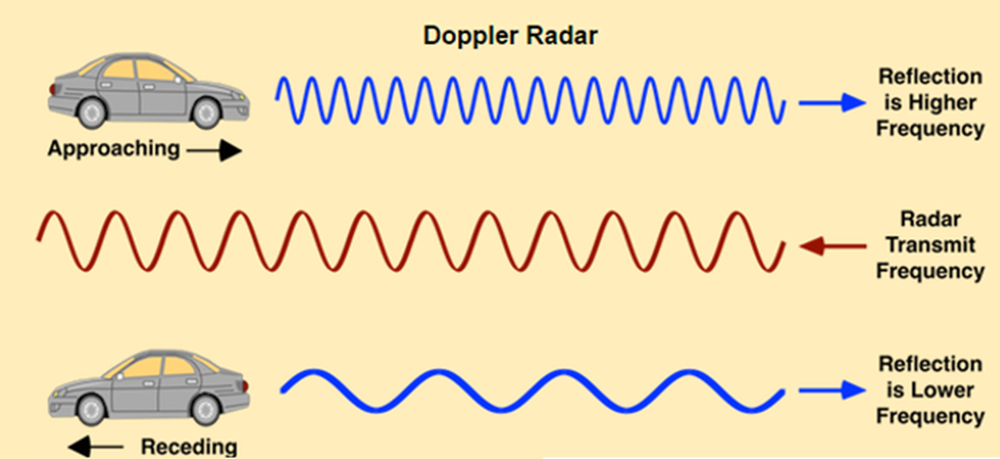
Doppler Speed Measurement

The velocity estimation for radar is based on an age old phenomenon called the doppler effect. As per doppler theory an approaching target will shift an emitted and reflected frequency higher, whereas a receding target will shift the both frequencies to be lower than the transmitted frequency.

The same principle is used in the radar guns to catch the speed violators, or even in sports to measure the speed of a ball.

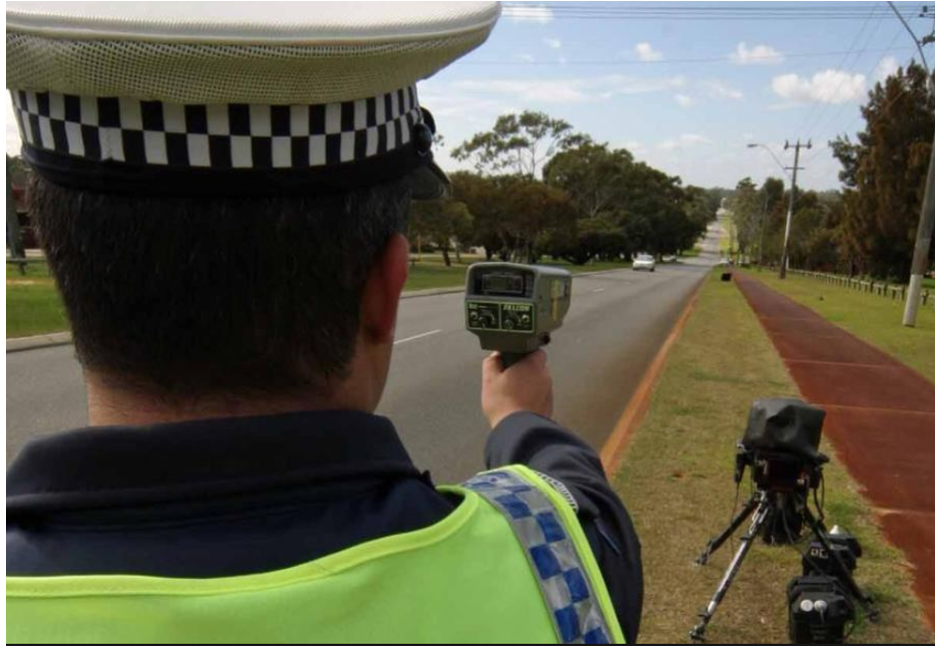

#### FMCW Doppler Measurements

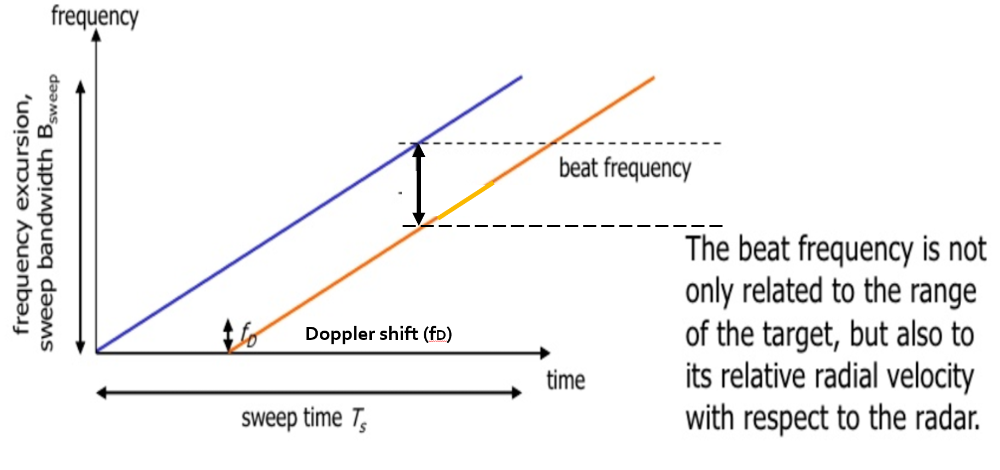
FMCW Doppler Estimation, source : Delft University of Technology

As discussed above, there will be a shift in the received signal frequency due to the doppler effect of the target’s velocity. The doppler shift is directly proportional to the velocity of the target as shown below.

**f_D =  = 2ν_r/λ**

* f_D : shift in the transmitted frequency due to the doppler
* ν_r : relative velocity of the target
* λ : wavelength of the signal

By measuring the shift in the frequency due to doppler, radar can determine the velocity. The receding target will have a negative velocity due to the frequency dropping lower, whereas the approaching target will have positive velocity as the frequency shifts higher.

The beat frequency comprises of both frequency components: f_r(frequency delta due to range) and f_d(frequency shift due to velocity). Although, in the case of automotive radar the **f_d is very small** in comparison to the f_r. Hence, **the doppler velocity is calculated by measuring the rate of change of phase across multiple chirps**.

The following equation shows the relationship between the rate of change of the phase \PhiΦ, and the frequency:

**dΦ/dt = frequency**

#### DOPPLER PHASE SHIFT
Keeping that in consideration, we calculate the doppler frequency by measuring the rate of change of phase. The phase change occurs due to small displacement of a moving target for every chirp duration. Since, each chirp duration is generally in microseconds, it results in small displacement in mm (millimeters). These small displacements for every chirp leads to change in phase. Using this **rate of change of phase** we can determine the **doppler frequency**.

Let's see how :

If the path between a target and the radar is changed by an amount Δx, the phase of the wave received by radar is shifted by

**Δφ = Δx/λ (λ=2πor360°)**

**Δφ = f∗Δx/c (λ=f/c)**

where λ and f are, respectively, the wavelength and frequency of the signal and c is the speed of propagation. The resulting change in observed frequency is

**Δf= Δφ/Δt**

where Δt is the time taken for the observation of the phase change.

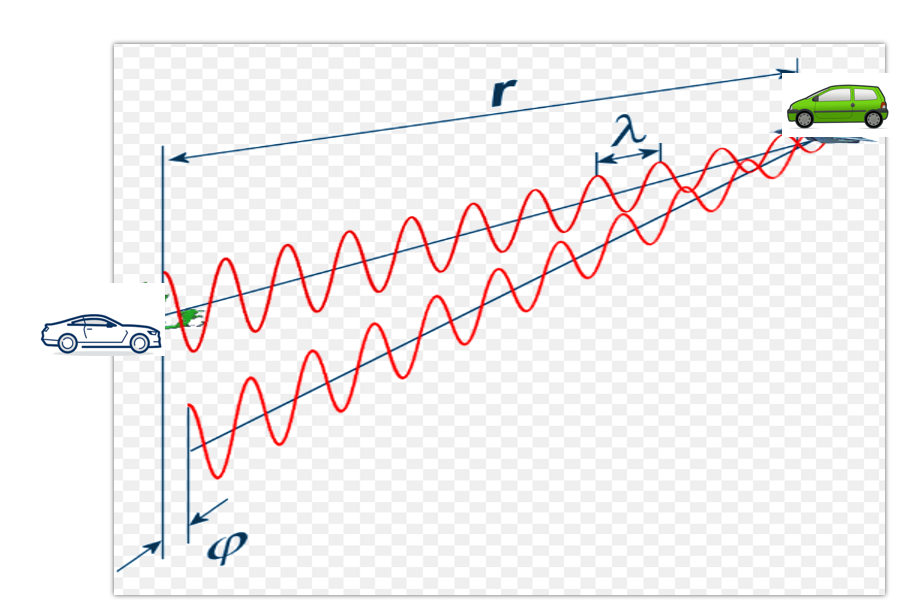

#### Doppler Estimation Exercises
Using the following MATLAB code sample, complete the TODOs to calculate thevelocity in m/s of four targets with following doppler frequency shifts: [3 KHz, 4.5 KHz, 11 KHz, -3 KHz].

You can use the following parameter values:
* The radar's operating frequency = 77 GHz
* The speed of light c = 3*10^8

> see code in `doppler_estimation.m`


#### Doppler Estimation Further Research
For additional resources related to doppler estimation, see these [lecture notes](http://www.phys.uconn.edu/~gibson/Notes/Section6_3/Sec6_3.htm).


### d) Fast Fourier Transform (FFT)

#### FFT Overview
So far we discussed the theory of range and doppler estimation along with the equations to calculate them. But, for a radar to efficiently process these measurements digitally, the signal needs to be converted from analog to digital domain and further from time domain to frequency domain.

ADC (Analog Digital Converter) converts the analog signal into digital. But, post ADC the Fast Fourier Transform is used to convert the signal from time domain to frequency domain. Conversion to frequency domain is important to do the spectral analysis of the signal and determine the shifts in frequency due to range and doppler.

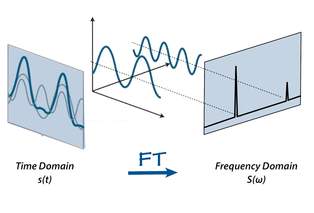
Time Domain to Frequency Domain Conversion using FFT. source : mriquestions.com

The traveling signal is in time domain. Time domain signal comprises of multiple frequency components as shown in the image above. In order to separate out all frequency components the FFT technique is used.

For the purpose of this course we don’t have to get into mathematical details of FFT. But, it is important to understand the use of FFT in radar’s digital signal processing. It gives the frequency response of the return signal with each peak in frequency spectrum representing the detected target’s chararcterstics.

Learn more on FFT implementation [here](https://www.youtube.com/watch?v=t_NMmqTRPIY&feature=youtu.be).

#### FFT and FMCW
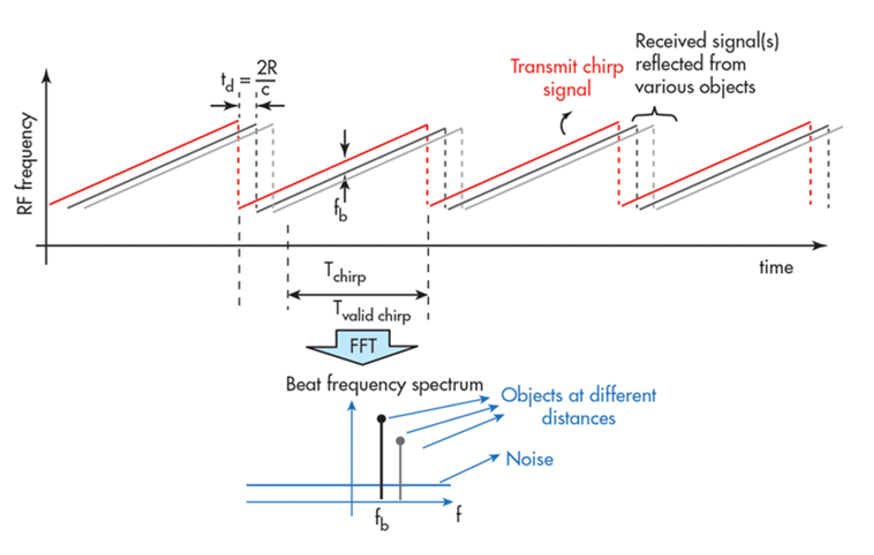
Fast Fourier Transform, source : Texas Instruments

As seen in the image below, the Range FFTs are run for every sample on each chirp. Since **each chirp is sampled N times**(sampling rate), it will generate a range FFT block of **N * (Number of chirps)** in total. These FFT blocks are also called ***FFT bins***.

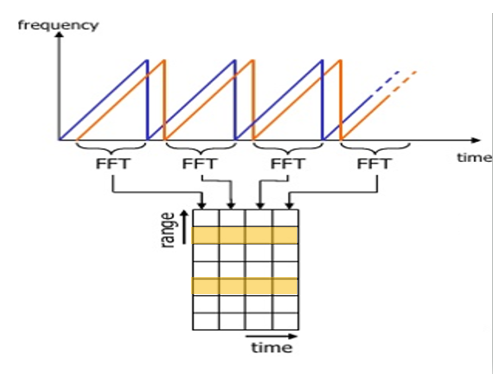
Range FFT, source : Delft University of Technology

Each chirp is sampled N times, and for each sample it produces a range bin. The process is repeated for every single chirp. Hence creating a FFT block of N*(Number of chirps).

Each bin in every column of block represents increasing range value, so that the **end of last bin represents the maximum range** of a radar.

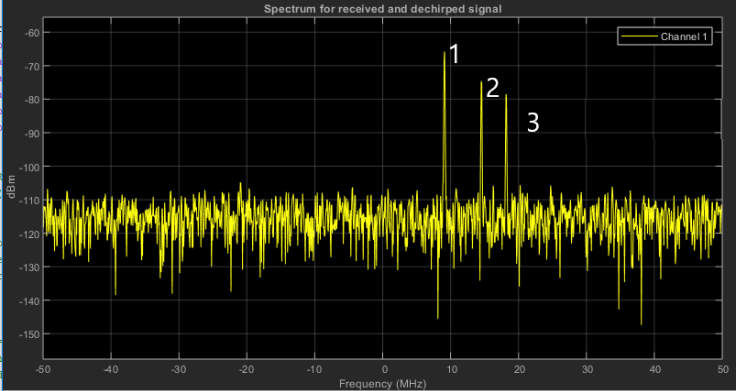
Output of Range FFT in MATLAB. X-axis = Beat Frequency, Y-axis = Signal power in dBm

Above is the output of the ***1st stage FFT (i.e Range FFT)***. The three peaks in the frequency domain corresponds to the beat frequencies of three different cars located at 150, 240 and 300 m range from the ego vehicle.

#### Fast Fourier Transform Exercise
In the following exercise, you will use a Fourier transform to find the frequency components of a signal buried in noise. Specify the parameters of a signal with a sampling frequency of 1 kHz and a signal duration of 1.5 seconds.

To implement the 1st stage FFT, you can use the following steps:

1. Define a signal. In this case (amplitude = A, frequency = f)
```c++
signal = A*cos(2*pi*f*t)
```

2. Run the fft for the signal using MATLAB fft function for dimension of samples N.
```c++
signal_fft = fft(signal,N);
```

3. The output of FFT processing of a signal is a complex number (a+jb). Since, we just care about the magnitude we take the absolute value (sqrt(a^2+b^2)) of the complex number.
```c++
signal_fft = abs(signal_fft);
```

4. FFT output generates a mirror image of the signal. But we are only interested in the positive half of signal length L, since it is the replica of negative half and has all the information we need.
```c++
signal_fft  = signal_fft(1:L/2-1)
```

5. Plot this output against frequency.

> see code in `fft.m`


#### Doppler Estimation Further Research
For additional resources related to FFT, see these [lecture notes](https://classroom.udacity.com/nanodegrees/nd313/parts/0701cbc4-73a7-4e19-895a-0bd0695f0365/modules/b52e21b1-f7ef-434a-9378-58b75dfa6800/lessons/f48cb6e7-1bf7-4ffb-81fa-48ad13531ff8/concepts/www.phys.nsu.ru/cherk/fft.pdf).


### e) The 2D FFT

Once the range bins are determined by running range FFT across all the chirps, a second FFT is implemented along the second dimension to determine the doppler frequency shift. As discussed, the doppler is estimated by processing the rate of change of phase across multiple chirps. Hence, the doppler FFT is implemented after all the chirps in the segment are sent and range FFTs are run on them.

The output of the first FFT gives the beat frequency, amplitude, and phase for each target. This phase varies as we move from one chirp to another (one bin to another on each row) due to the target’s small displacements. Once the second FFT is implemented it determines the rate of change of phase, which is nothing but the doppler frequency shift.

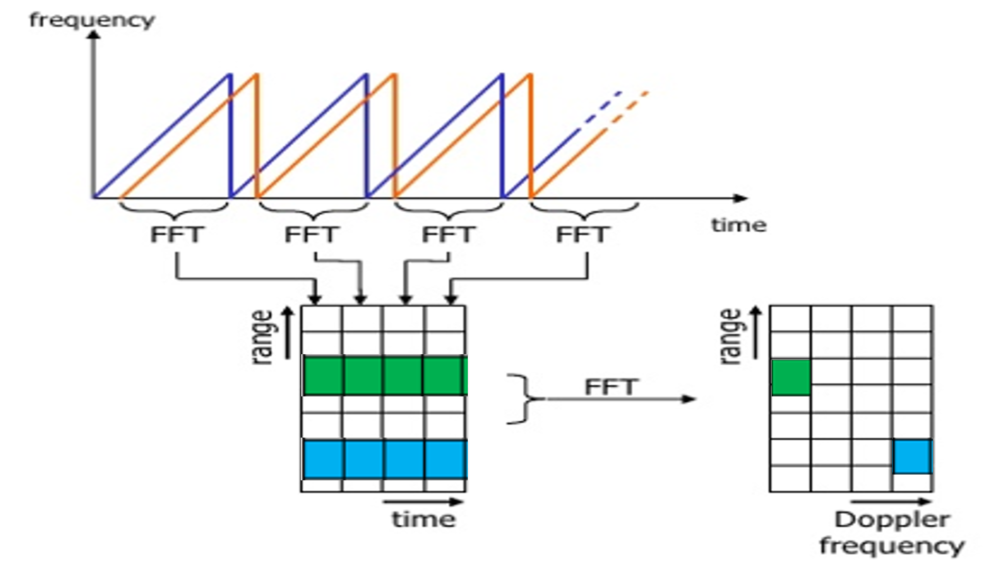
After running 2nd FFT across the rows of FFT block we get the doppler FFT. The complete implementation is called 2D FFT.

After 2D FFT each bin in every **column** of block represents increasing **range** value and each bin in the **row** corresponds to a **velocity** value.

The output of Range Doppler response represents an image with Range on one axis and Doppler on the other. This image is called as Range Doppler Map (RDM). These maps are often used as user interface to understand the perception of the targets.

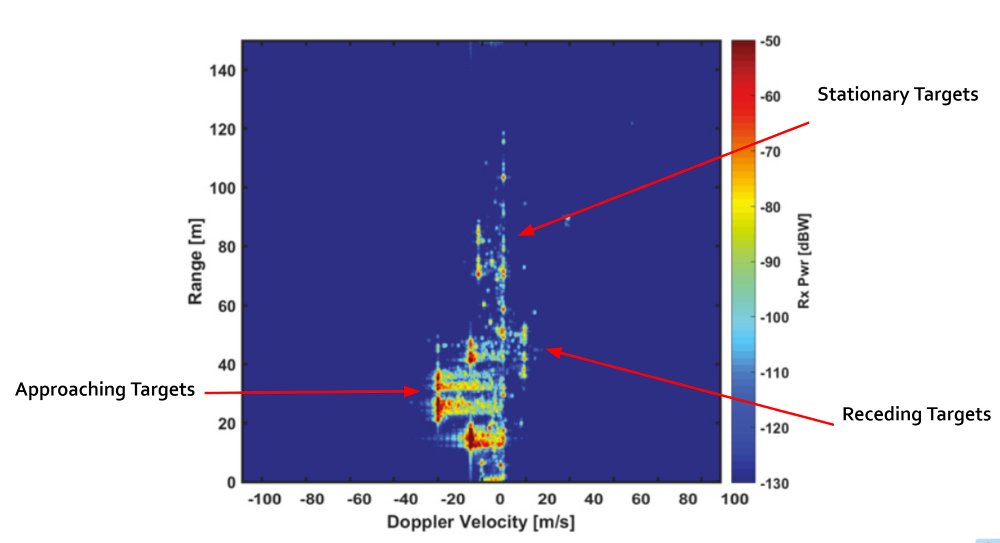

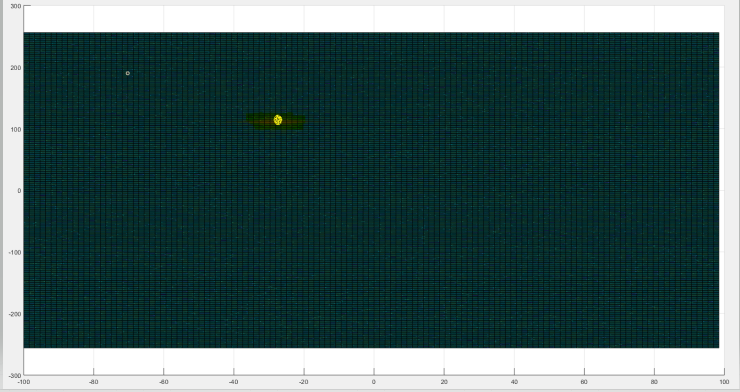
2D FFT output for single target. The x-axis here is the velocity and the y-axis is the range.

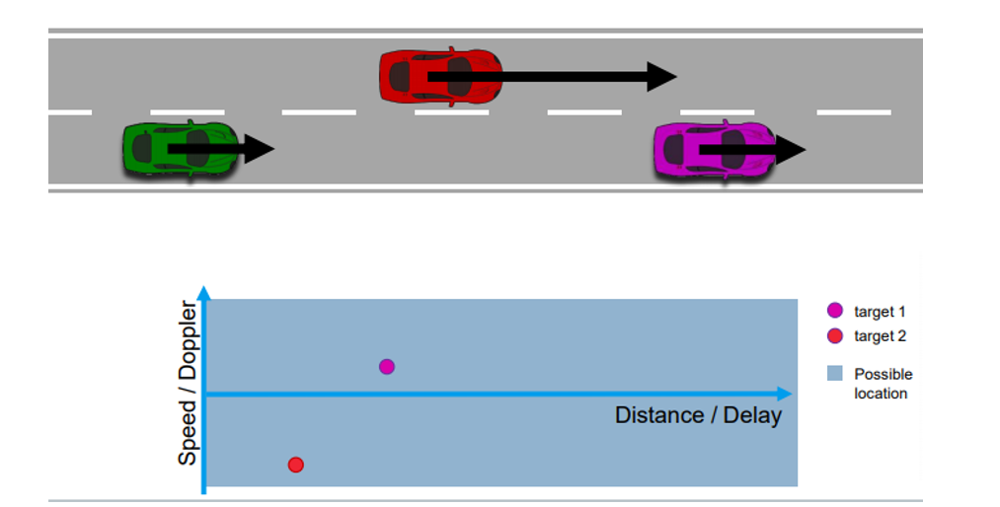
Range Doppler Map, source : rohde-schwarz

#### 2D FFT In MATLAB
The following steps can be used to compute a 2D FFT in MATLAB:

1. Take a 2D signal matrix
2. In the case of Radar signal processing. Convert the signal in MxN matrix, where M is the size of Range FFT samples and N is the size of Doppler FFT samples:
```c++
signal  = reshape(signal, [M, N]);
```

3. Run the 2D FFT across both the dimensions.

```c++
signal_fft = fft2(signal, M, N);
```

Note the following from the [documentation](https://www.mathworks.com/help/matlab/ref/fft2.html):

> `Y = fft2(X)` returns the 2D FFT of a matrix using a fast Fourier transform algorithm, which is equivalent to computing `fft(fft(X).').'`. If `X` is a multidimensional array, then fft2 takes the 2-D transform of each dimension higher than 2. The output `Y` is the same size as `X`. `Y = fft2(X,M,N)` truncates `X` or pads `X` with trailing zeros to form an m-by-n matrix before computing the transform. `Y` is m-by-n. If `X` is a multidimensional array, then fft2 shapes the first two dimensions of `X` according to m and n.

4. Shift zero-frequency terms to the center of the array

```c++
signal_fft = fftshift(signal_fft);
```

5. Take the absolute value

```c++
signal_fft = abs(signal_fft);
```

6. Here since it is a 2D output, it can be plotted as an image. Hence, we use the imagesc function

```c++
imagesc(signal_fft);
```

#### 2D FFT Exercise
In the following exercise, you will practice the 2D FFT in MATLAB using some generated data. The data generated below will have the correct shape already, so you should just need to use steps 3-6 from above. 

> see code in `fft_2d.m`

[Solution](https://www.mathworks.com/help/matlab/ref/fft2.html)


#### Further Research
For more information about the 2D FFT, see these [notes](http://people.ciirc.cvut.cz/~hlavac/TeachPresEn/11ImageProc/12FourierTxEn.pdf).

### f) What Kind of Math Do Radar Engineers Use?
* Linear Algebra
* Trignometry
* Statistics
* Polar Coordinates
* Extended Kalman filter
* Fast Fourier Transforms
